In [27]:
import os
import sys
import glob
import pandas as pd
import math
import matplotlib.pyplot as plt
#import celldancer as cd
#import celldancer.cdplt as cdplt
#from celldancer.cdplt import colormap
#from celldancer.utilities import export_velocity_to_dynamo
#import celldancer.utilities as cdutil
import scanpy as sc
import scvelo as scv
import cellrank as cr
import scFates as scf
import palantir
from SEACells.core import summarize_by_SEACell
sc.set_figure_params()
scf.set_figure_pubready()
%matplotlib inline

In [ ]:
adata = sc.read_h5ad("/media/chang/HDD-3/chang/david/thal.h5ad")

In [ ]:
ad = summarize_by_SEACell(adata, SEACells_label='SEACell')
ad.layers['raw'] = ad.X

In [ ]:
scv.pp.filter_genes(adata, min_shared_counts=10)
scv.pp.normalize_per_cell(adata, enforce=True)
scv.pp.filter_genes_dispersion(adata, n_top_genes=3000)
scv.pp.log1p(adata)
scv.pp.moments(adata, n_pcs=30, n_neighbors=20)

In [ ]:
scv.tl.recover_dynamics(adata, n_jobs=32)

In [5]:
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:01:52) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/64 cores)


  0%|          | 0/148580 [00:00<?, ?cells/s]

/home/chang/miniconda3/envs/cellDancer/lib/python3.7/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:04:25) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [6]:
adata.write('/media/chang/HDD-3/chang/david/thal_scv.h5ad', compression='gzip')

In [4]:
adata = scv.read('/media/chang/HDD-3/chang/david/thal_scv.h5ad')

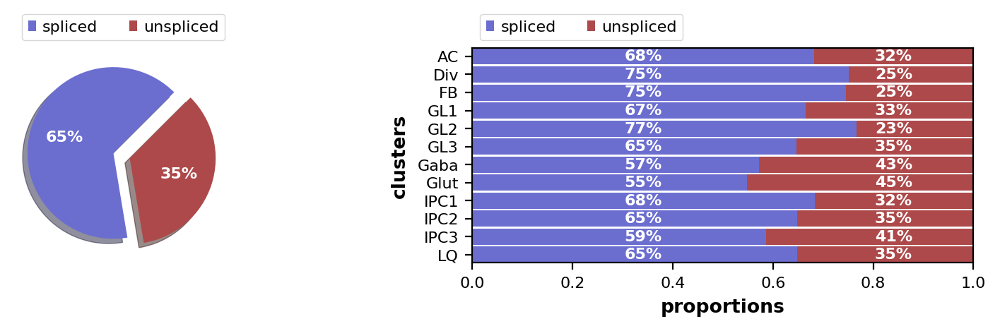

In [5]:
scv.pl.proportions(adata)

computing velocity embedding
    finished (0:00:33) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


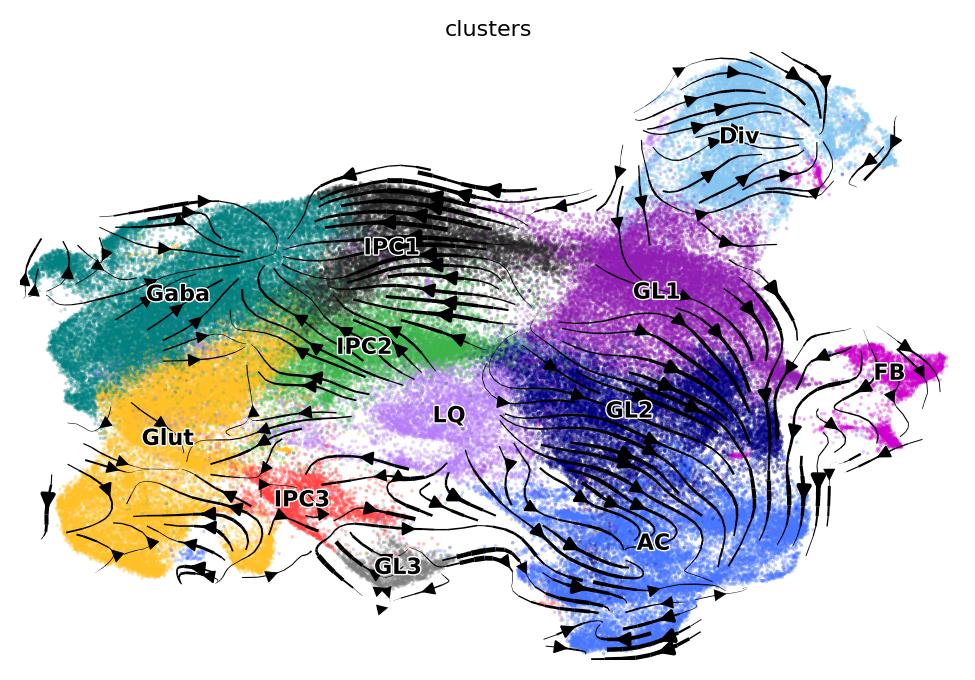

In [6]:
scv.pl.velocity_embedding_stream(adata, basis='umap')

In [7]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:50]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='clusters')

testing for differential kinetics
    finished (0:03:35) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


In [8]:
scv.tl.velocity(adata, diff_kinetics=True)
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:56) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/64 cores)


  0%|          | 0/148580 [00:00<?, ?cells/s]

/home/chang/miniconda3/envs/cellDancer/lib/python3.7/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:08:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:34) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


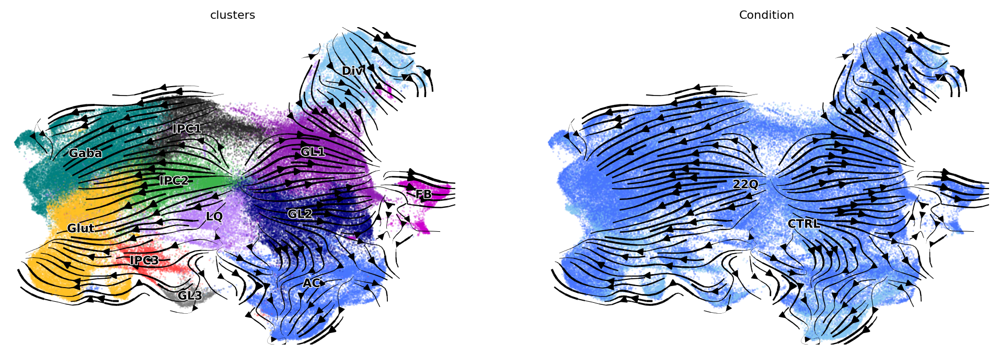

In [9]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=["clusters", "Condition"])

In [10]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:50]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='Condition')

testing for differential kinetics
    finished (0:02:15) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


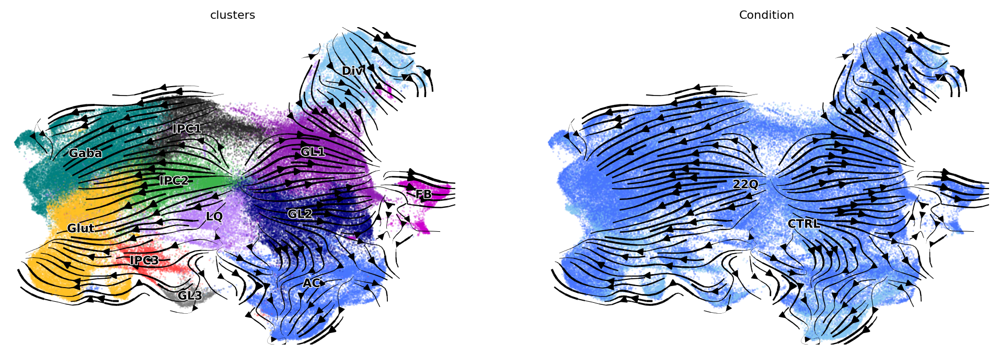

In [11]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=["clusters", "Condition"])

computing terminal states
    identified 10 regions of root cells and 3 regions of end points .
    finished (0:01:19) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:01:30) --> added 
    'latent_time', shared time (adata.obs)


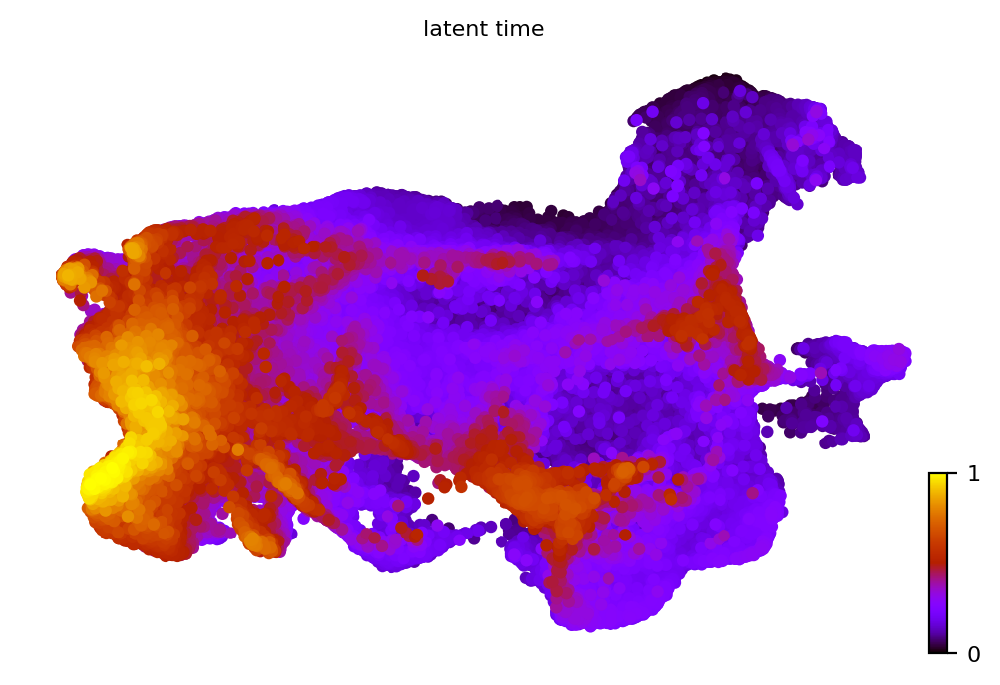

In [12]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

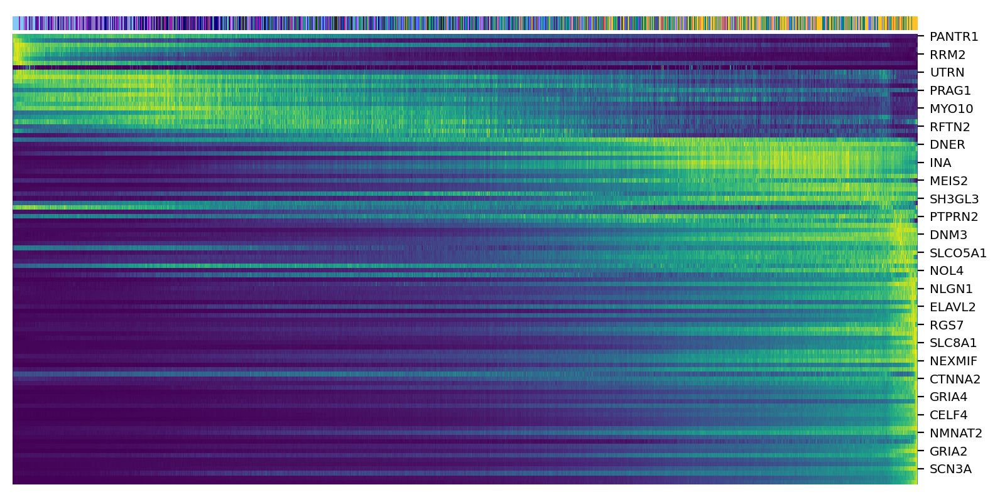

In [9]:
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='clusters', n_convolve=100)

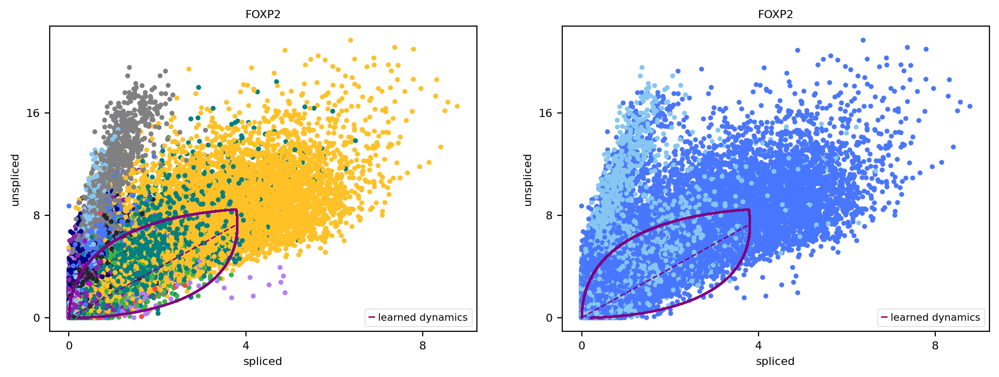

In [10]:
scv.pl.scatter(adata, ['FOXP2'], color=['clusters', 'Condition'], size=50, frameon=True)

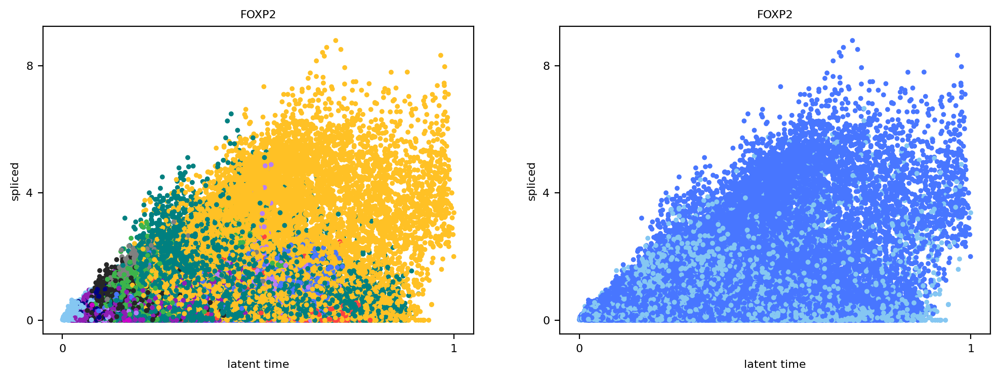

In [11]:
scv.pl.scatter(adata, x='latent_time', y=['FOXP2'],
               color=['clusters', 'Condition'], frameon=True, size=50)

In [13]:
adata.write('/media/chang/HDD-3/chang/david/thal_scv_dif.h5ad', compression='gzip')

In [13]:
pca_projections = pd.DataFrame(adata.obsm["X_pca"],index=adata.obs_names)

In [31]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=5)

Determing nearest neighbor graph...


In [32]:
adata.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adata,n_neighbors=30,use_rep="X_palantir")

In [39]:
# draw ForceAtlas2 embedding using 2 first PCs as initial positions
#adata.obsm["X_pca2d"]=adata.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adata,init_pos='X_umap')

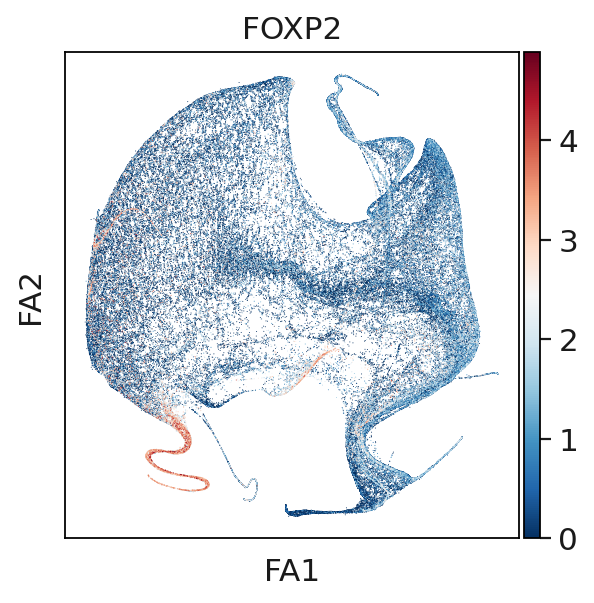

In [40]:
sc.pl.draw_graph(adata,color="FOXP2",color_map="RdBu_r")

In [41]:
scf.tl.tree(adata,method="ppt",Nodes=200,use_rep="umap",
            device="cpu",seed=1,ppt_lambda=100,ppt_sigma=0.025,ppt_nsteps=200)

inferring a principal tree --> parameters used 
    200 principal points, sigma = 0.025, lambda = 100, metric = euclidean
    fitting:  32%|██████████████████████████████████████████████████████████████▍                                                                                                                                 | 65/200 [00:26<00:54,  2.49it/s]
    converged
    more than 30 tips detected!
    finished (0:00:26) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


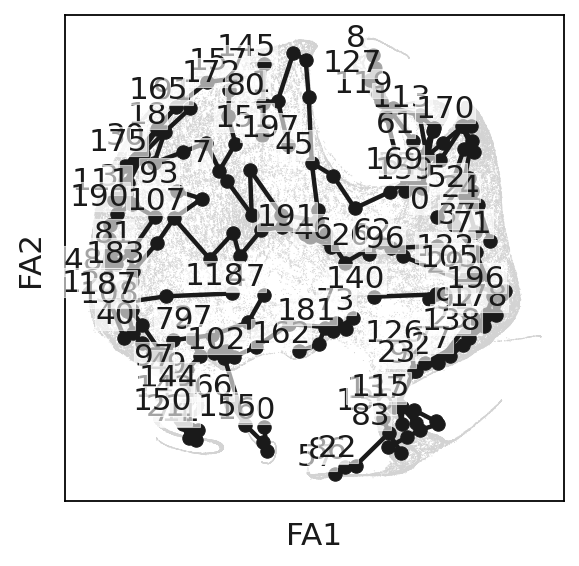

In [42]:
scf.pl.graph(adata)

In [ ]:
cr.tl.terminal_states(adata, cluster_key="clusters", weight_connectivities=0.2, n_states=3)

/home/chang/miniconda3/envs/cellDancer/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.
/home/chang/miniconda3/envs/cellDancer/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


  0%|          | 0/148580 [00:00<?, ?cell/s]

  0%|          | 0/148580 [00:00<?, ?cell/s]

In [1]:
cr.pl.terminal_states(adata)

NameError: name 'cr' is not defined

/home/chang/miniconda3/envs/cellDancer/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.
/home/chang/miniconda3/envs/cellDancer/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


  0%|          | 0/148580 [00:00<?, ?cell/s]

  0%|          | 0/148580 [00:00<?, ?cell/s]

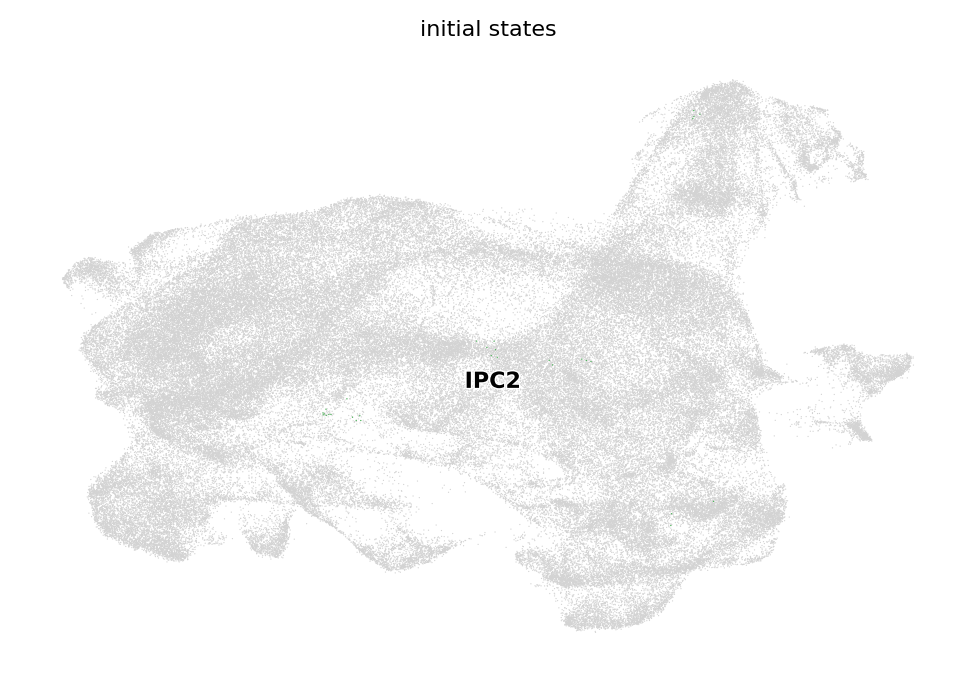

In [ ]:
cr.tl.initial_states(adata, cluster_key="clusters")
cr.pl.initial_states(adata, discrete=True)

Defaulting to `'gmres'` solver.


/home/chang/miniconda3/envs/cellDancer/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.


  0%|          | 0/1 [00:00<?, ?/s]

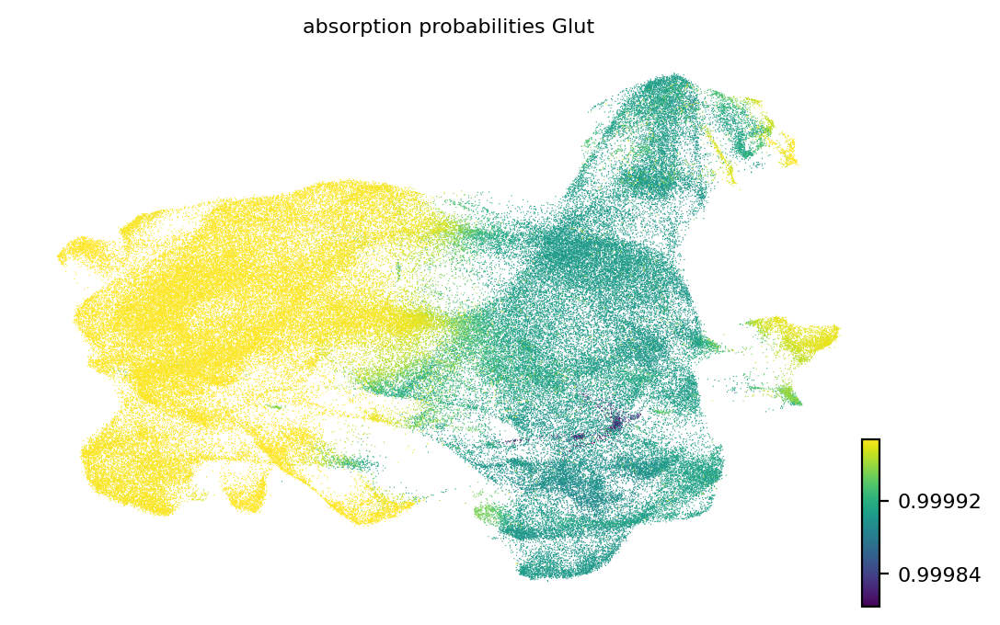

In [22]:
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False)

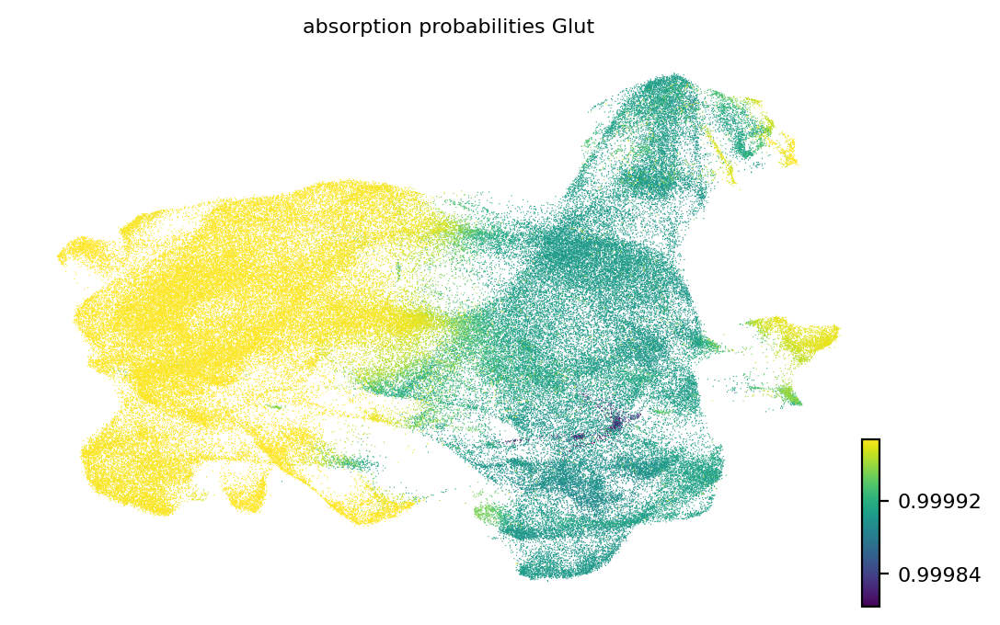

In [23]:
cr.pl.lineages(adata, same_plot=True)

In [24]:
scv.tl.recover_latent_time(
    adata, root_key="initial_states_probs", end_key="terminal_states_probs"
)


computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:35) --> added 
    'latent_time', shared time (adata.obs)


In [25]:
scv.tl.paga(
    adata,
    groups="clusters",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)

running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:35) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/home/chang/.local/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:724: MatplotlibDeprecationWarning: Passing *transOffset* without *offsets* has no effect. This behavior is deprecated since 3.5 and in 3.6, *transOffset* will begin having an effect regardless of *offsets*. In the meantime, if you wish to set *transOffset*, call collection.set_offset_transform(transOffset) explicitly.
  alpha=alpha,


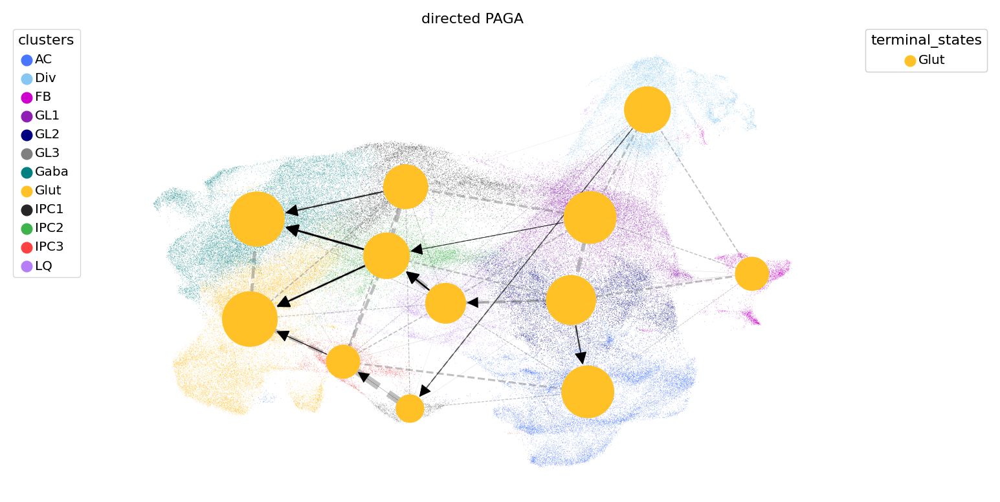

In [26]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="clusters",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=5,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
)

In [ ]:
cr.tl.lineage_drivers(adata)

In [27]:
scf.tl.cellrank_to_tree(adata,time="latent_time",Nodes=300,seed=1)

Converting CellRank results to a principal tree --> with .obsm['X_fates'], created by combining:
    .obsm['X_fate_simplex_fwd'] (from cr.pl.circular_projection) and adata.obs['latent_time']



ValueError: Expected at least `3` lineages, found `1`.

In [ ]:
scf.pl.graph(adata)

In [ ]:
scf.tl.root(adata,83)
scf.tl.pseudotime(adata,n_jobs=20,n_map=100,seed=42)

In [ ]:
sc.pl.umap(adata,color=["seg","milestones"])

In [ ]:
cdutil.adata_to_df_with_embed(adata,
                              us_para=['Mu','Ms'],
                              cell_type_para='clusters',
                              embed_para='X_umap',
                              save_path='/media/chang/HDD-3/chang/david/cell_type_u_s.csv')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1938/1938 [19:46<00:00,  1.63it/s]


In [3]:
cell_type_u_s_path='/media/chang/HDD-3/chang/david/cell_type_u_s.csv'
cell_type_u_s=pd.read_csv(cell_type_u_s_path)
cell_type_u_s

,gene_name,unsplice,splice,cellID,clusters,embedding1,embedding2
0,ISG15,0.000000,0.087579,AAACCCAAGAATACAC_1,Glut,-8.492877,-4.668424
1,ISG15,0.007105,0.000000,AAACCCAAGCCATTTG_1,Glut,-8.906708,-4.005784
2,ISG15,0.031852,0.809824,AAACCCAAGCGTTACT_1,AC,5.395907,-6.836592
3,ISG15,0.057790,0.584764,AAACCCAAGCTAGAGC_1,GL2,5.816398,-1.744540
4,ISG15,0.000000,0.270560,AAACCCAAGCTCTGTA_1,IPC1,-2.052774,5.305272
...,...,...,...,...,...,...,...
287948035,PCDH11Y,0.967983,0.029691,TTTGTCAGTCGACTAT_5,GL1,3.808009,2.408088
287948036,PCDH11Y,0.347626,0.004648,TTTGTCAGTGTTCTTT_5,Div,6.926080,8.381535
287948037,PCDH11Y,0.337649,0.000000,TTTGTCAGTTGTTTGG_5,AC,2.574526,-4.582657
287948038,PCDH11Y,1.126930,1.241454,TTTGTCATCCTTGCCA_5,GL1,6.096765,2.707901


In [ ]:
gene_list=['RNF220', "TCF7L2", "FOXP2", "SOX2"]

loss_df, cellDancer_df=cd.velocity(cell_type_u_s,\
                                   gene_list=gene_list,\
                                   permutation_ratio=0.125,\
                                   n_jobs=8,save_path="/media/chang/HDD-3/chang/david/")

Using /media/chang/HDD-3/chang/david/cellDancer_velocity_2023-04-29 15-51-20 as the output path.
['SOX2']  not in the data cell_type_u_s
Arranging genes for parallel job.
3  genes were arranged to  1  portion.



Velocity Estimation:   0%|          | 0/1 [00:00<?, ?it/s]                                                                                                                                                                                         
                                                                                                                                                                                                                                                   

In [ ]:
ncols=5
height=math.ceil(len(gene_list)/5)*4
fig = plt.figure(figsize=(20,height))```

for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.scatter_gene(
        ax=ax,
        x='splice',
        y='unsplice',
        cellDancer_df=cellDancer_df,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5,
        s = 5,
        velocity=True,
        gene=gene_list[i])

    ax.set_title(gene_list[i])
    ax.axis('off')

plt.show()

In [ ]:
cellDancer_df=cd.compute_cell_velocity(cellDancer_df=cellDancer_df, projection_neighbor_choice='gene', expression_scale='power10', projection_neighbor_size=10, speed_up=(100,100))

# plot cell velocity
fig, ax = plt.subplots(figsize=(10,10))
cdplt.scatter_cell(ax,
                   cellDancer_df,
                   colors=colormap.colormap_erythroid,
                   alpha=0.5,
                   s=10,
                   velocity=True,
                   legend='on',
                   min_mass=15,
                   arrow_grid=(20,20),
                   custom_xlim=[-6,13],
                   custom_ylim=[2,16], )
ax.axis('off')
plt.show()


In [ ]:
dyn.pp.recipe_monocle(adata, n_top_genes=4000, fg_kwargs={"shared_count": 20})
dyn.tl.dynamics(adata, model='static')

In [ ]:
cellDancer_df = pd.read_csv('/media/chang/HDD-3/chang/david/cell_type_u_s.csv')
adata = export_velocity_to_dynamo(cellDancer_df,adata)